## 05 - ENTIRE PERIOD ANALYSIS

###### At this stage we will will go to study the whole perdiod under the point of view of the heat stress indices

Function defining the heat indices

In [4]:
def calculate_humidex(Ta_k, Td_k):
    """
    Calcola l'Humidex in °C usando la formula di Masterson/Chin.
    Parametri:
      - Ta_k: temperatura dell'aria in Kelvin
      - Td_k: temperatura di rugiada in Kelvin
    Ritorna:
      - Humidex in °C
    """
    # Conversione in °C
    Ta_c = Ta_k - 273.15
    Td_c = Td_k - 273.15

    # Evita valori troppo bassi per Td
    Td_c = np.maximum(Td_c, -73.15)  # ~200 K

    # Calcolo della pressione di vapore (e) in hPa
    exponent = 5417.7530 * ((1.0 / 273.16) - (1.0 / (Td_c + 273.16)))
    e = 6.11 * np.exp(exponent)

    # Formula Humidex
    humidex_c = Ta_c + 0.5555 * (e - 10.0)
    return humidex_c


def calculate_relative_humidity(Ta_c, Td_c):
    """
    Calcola l'umidità relativa in %,
    assumendo Ta_c e Td_c in °C.
    """
    RH = 100.0 * np.exp((17.625 * Td_c) / (243.04 + Td_c)
                        - (17.625 * Ta_c) / (243.04 + Ta_c))
    return RH


def calculate_wbt(Ta_c, RH):
    """
    Calcola la Wet-Bulb Temperature (WBT) in °C (formula semplificata di Stull).
    Parametri:
      - Ta_c: temperatura in °C
      - RH: umidità relativa in %
    """
    WBT_c = (Ta_c * np.arctan(0.151977 * np.sqrt(RH + 8.313659))
             + np.arctan(Ta_c + RH)
             - np.arctan(RH - 1.676331)
             + 0.00391838 * RH**1.5 * np.arctan(0.023101 * RH)
             - 4.686035)
    return WBT_c


def calculate_wbgt(Ta_c, WBT_c):
    """
    Calcola WBGT in °C con la formula semplificata:
      WBGT = 0.7 * WBT + 0.3 * Ta
    Parametri:
      - Ta_c: temperatura in °C
      - WBT_c: Wet-Bulb Temperature in °C
    """
    WBGT_c = 0.7 * WBT_c + 0.3 * Ta_c
    return WBGT_c


def calculate_lethal_heat_stress_index(WBT_c, RH):
    """
    Calcola Lethal Heat Stress Index (Ls) in °C con la formula:
      Ls = WBT + 4.5 * (1 - (RH/100)^2)
    Parametri:
      - WBT_c: Wet-Bulb Temperature in °C
      - RH: umidità relativa in %
    """
    Ls_c = WBT_c + 4.5 * (1.0 - (RH / 100.0)**2)
    return Ls_c


def calculate_utci(Ta_c, RH):
    """
    Calcola una versione semplificata di UTCI in °C,
    Parametri:
      - Ta_c: temperatura in °C
      - RH: umidità relativa in %
    """
    # Pressione di vapore approssimata
    pa = RH / 100.0 * 6.105 * np.exp(17.27 * Ta_c / (237.7 + Ta_c))

    # Formula semplificata
    UTCI_c = (Ta_c
              + 0.607562
              + 0.022771 * Ta_c
              - 0.003578 * RH
              - 0.000119 * Ta_c * RH)
    return UTCI_c

#### 05.11 - Frequency of excedance preprocessing for a single year

The following maps are showing for a specific year how many times each pixel overpassed the threshold of each of the heat stress indices

In [5]:
import xarray as xr
import numpy as np
import pandas as pd
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from pyproj import Transformer
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from scipy.ndimage import uniform_filter

# === PARAMETRO DELL'ANNO ===
selected_year = 2017

# === SOGHIE DI PERICOLOSITÀ ===
thresholds = {
    "Humidex (°C)": 45,
    "WBGT (°C)": 29,
    "Lethal Heat Stress Index (°C)": 27,
    "UTCI (°C)": 45
}

# === CARICAMENTO DATI ===
ds_temp = xr.open_dataset("C:/Users/andre/OneDrive/Desktop/Datasets_Geoinfprj/Enlarged_datasets/2m_air_temp/air_temperature_era5-81_23.nc")
ds_dew = xr.open_dataset("C:/Users/andre/OneDrive/Desktop/Datasets_Geoinfprj/Enlarged_datasets/dew_point_temp/dew_point_temp_81_23.nc")
ds_temp["time"] = pd.to_datetime(ds_temp["time"].values)
ds_dew["time"] = pd.to_datetime(ds_dew["time"].values)

# === INIZIALIZZA CONTEGGI ===
humidex_freq = None
wbgt_freq = None
lhs_freq = None
utci_freq = None

# === CICLO MENSILE ===
for month in tqdm(range(1, 13), desc=f"Processing {selected_year}"):
    mask = (ds_temp["time"].dt.year == selected_year) & (ds_temp["time"].dt.month == month)
    
    T_k = ds_temp["T_2M"].sel(time=mask)
    Td_k = ds_dew["TD_2M"].sel(time=mask)
    Td_k = Td_k.where(Td_k > 243.15).interpolate_na(dim="rlat", method="linear").interpolate_na(dim="rlon", method="linear")
    
    T_c = T_k - 273.15
    Td_c = Td_k - 273.15
    
    RH = calculate_relative_humidity(T_c, Td_c)
    humidex = calculate_humidex(T_k, Td_k)
    wbt = calculate_wbt(T_c, RH)
    wbgt = calculate_wbgt(T_c, wbt)
    lhs = calculate_lethal_heat_stress_index(wbt, RH)
    utci = calculate_utci(T_c, RH)
    
    # Conta superamenti soglia
    h_freq = (humidex > thresholds["Humidex (°C)"]).sum(dim="time")
    w_freq = (wbgt > thresholds["WBGT (°C)"]).sum(dim="time")
    l_freq = (lhs > thresholds["Lethal Heat Stress Index (°C)"]).sum(dim="time")
    u_freq = (utci > thresholds["UTCI (°C)"]).sum(dim="time")

    # Somma incrementale
    if humidex_freq is None:
        humidex_freq = h_freq
        wbgt_freq = w_freq
        lhs_freq = l_freq
        utci_freq = u_freq
    else:
        humidex_freq += h_freq
        wbgt_freq += w_freq
        lhs_freq += l_freq
        utci_freq += u_freq

Processing 2017: 100%|█████████████████████████████████████████████████████████████████| 12/12 [00:25<00:00,  2.16s/it]


#### 05.12 - Frequency of excedance plot for a single year

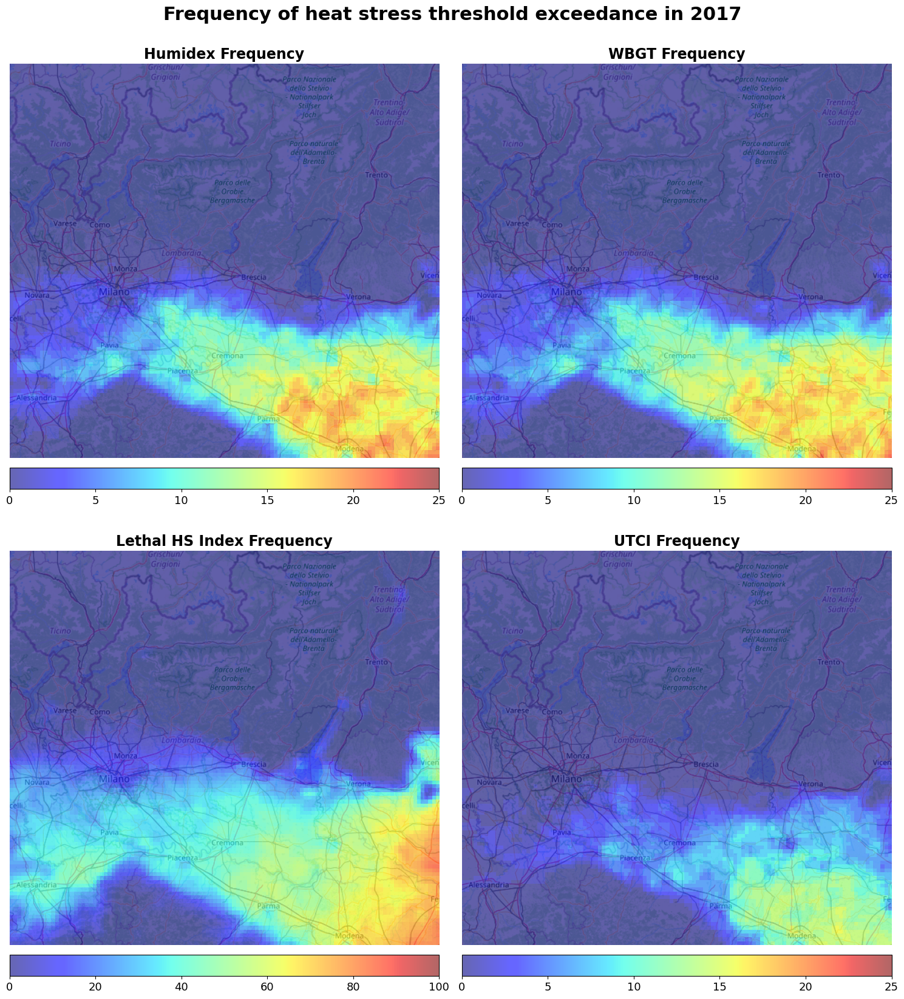

In [50]:
from scipy.ndimage import gaussian_filter, uniform_filter, median_filter

# === SMOOTHING PERSONALIZZATO PER OGNI INDICE ===
humidex_smooth = uniform_filter(humidex_freq, size=3)
wbgt_smooth    = uniform_filter(wbgt_freq, size=3)
lhs_smooth     = uniform_filter(lhs_freq, size=3)
utci_smooth    = uniform_filter(utci_freq, size=3)

# === PARAMETRI DI STILE ===
title_fontsize = 22
map_title_fontsize = 17
colorbar_labelsize = 13

# === COORDINATE PER MESH ===
lon = ds_temp["lon"]
lat = ds_temp["lat"]
lon1d = lon[0, :] if lon.ndim == 2 else lon
lat1d = lat[:, 0] if lat.ndim == 2 else lat
lon_mesh, lat_mesh = np.meshgrid(lon1d, lat1d)

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_mesh, y_mesh = transformer.transform(lon_mesh, lat_mesh)

# === FUNZIONE DI PLOT ===
def plot_4maps_smoothed(datasets, titles, cmaps, alpha=0.6):
    fig, axs = plt.subplots(2, 2, figsize=(15, 17))
    plt.suptitle(f"Frequency of heat stress threshold exceedance in {selected_year}",
                 fontsize=title_fontsize, fontweight="bold", y=1.0)
    axs = axs.flatten()

    for i, (data, title, cmap) in enumerate(zip(datasets, titles, cmaps)):
        ax = axs[i]
        ax.set_xlim(x_mesh.min(), x_mesh.max())
        ax.set_ylim(y_mesh.min(), y_mesh.max())
        ctx.add_basemap(ax, crs="EPSG:3857", source=ctx.providers.OpenStreetMap.Mapnik, attribution=False)

        # === SCALA FISSA ===
        if "Lethal" in title:
            vmin, vmax = 0, 100
        else:
            vmin, vmax = 0, 25

        im = ax.imshow(data, extent=[x_mesh.min(), x_mesh.max(), y_mesh.min(), y_mesh.max()],
                       origin='lower', cmap=cmap, alpha=alpha, vmin=vmin, vmax=vmax)
        ax.set_title(title, fontsize=map_title_fontsize, fontweight='bold')
        ax.axis("off")

        # Colorbar
        cbar = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.02)
        cbar.ax.tick_params(labelsize=colorbar_labelsize)

    plt.tight_layout()
    return fig

# === PLOT ===
fig = plot_4maps_smoothed(
    datasets=[humidex_smooth, wbgt_smooth, lhs_smooth, utci_smooth],
    titles=["Humidex Frequency", "WBGT Frequency", "Lethal HS Index Frequency", "UTCI Frequency"],
    cmaps=["jet", "jet", "jet", "jet"]
)

output_path = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\frequenza_heatstressindices_2017.png"  # <-- cambia con la tua directory preferita
plt.savefig(output_path, dpi=300, bbox_inches="tight")

plt.show()

#### 05.2 - Heat stress indices exceedance cube generation 

The following code generates first 4 data cube (one for each index) and than merges them. Each data cube repsent and index, and how many time per year each pixel overpassed the threshold for that index. Thus each data cube has the dimension lat - lon - year and each cell value is the number of time the index has been overpassed. The analysis takes into account only the monthes of april - may - june - july - august - september

In [9]:
import xarray as xr
import numpy as np
import pandas as pd
from tqdm import tqdm
import os

# === PARAMETRI ===
output_folder = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heatstress_indices_exceedance_cube"  
years = np.arange(1981, 2024)
months = [4, 5, 6, 7, 8, 9]  # AMJJAS

# # === SOGHIE DI PERICOLOSITÀ STANDARD ===
# thresholds = {
#     "Humidex (°C)": 45,
#     "WBGT (°C)": 29,
#     "Lethal Heat Stress Index (°C)": 27,
#     "UTCI (°C)": 45
# }

# === SOGHIE DI PERICOLOSITÀ (Reduced)
thresholds = {
    "Humidex (°C)": 40,
    "WBGT (°C)": 27,
    "Lethal Heat Stress Index (°C)": 25,
    "UTCI (°C)": 38
}

# === FUNZIONI DA DEFINIRE (o importare)
# from functions import calculate_relative_humidity, calculate_humidex, calculate_wbt, calculate_wbgt, calculate_lethal_heat_stress_index, calculate_utci

# === CARICAMENTO DATI CLIMATICI ===
ds_temp = xr.open_dataset("C:/Users/andre/OneDrive/Desktop/Datasets_Geoinfprj/Enlarged_datasets/2m_air_temp/air_temperature_era5-81_23.nc")
ds_dew = xr.open_dataset("C:/Users/andre/OneDrive/Desktop/Datasets_Geoinfprj/Enlarged_datasets/dew_point_temp/dew_point_temp_81_23.nc")
ds_temp["time"] = pd.to_datetime(ds_temp["time"].values)
ds_dew["time"] = pd.to_datetime(ds_dew["time"].values)

# === INFORMAZIONI SPAZIALI
rlat_vals = ds_temp["rlat"].values
rlon_vals = ds_temp["rlon"].values
n_years, ny, nx = len(years), len(rlat_vals), len(rlon_vals)

# === INIZIALIZZA CUBI ===
humidex_cube = np.zeros((n_years, ny, nx), dtype=np.int16)
wbgt_cube    = np.zeros((n_years, ny, nx), dtype=np.int16)
lhs_cube     = np.zeros((n_years, ny, nx), dtype=np.int16)
utci_cube    = np.zeros((n_years, ny, nx), dtype=np.int16)

# === CICLO SUGLI ANNI ===
for i, year in enumerate(tqdm(years, desc="Processing all years")):
    # Maschera temporale AMJJAS
    mask = (ds_temp["time"].dt.year == year) & (ds_temp["time"].dt.month.isin(months))

    # Estrai temperature e punto di rugiada
    T_k = ds_temp["T_2M"].sel(time=mask)
    Td_k = ds_dew["TD_2M"].sel(time=mask)
    Td_k = Td_k.where(Td_k > 243.15).interpolate_na(dim="rlat", method="linear").interpolate_na(dim="rlon", method="linear")

    # Conversioni
    T_c = T_k - 273.15
    Td_c = Td_k - 273.15

    # Calcolo indici
    RH = calculate_relative_humidity(T_c, Td_c)
    humidex = calculate_humidex(T_k, Td_k)
    wbt = calculate_wbt(T_c, RH)
    wbgt = calculate_wbgt(T_c, wbt)
    lhs = calculate_lethal_heat_stress_index(wbt, RH)
    utci = calculate_utci(T_c, RH)

    # === CALCOLO MASSIMI GIORNALIERI E CONTEGGIO GIORNI CON SUPERAMENTO ===
    humidex_max = humidex.groupby("time.date").max("time")
    wbgt_max    = wbgt.groupby("time.date").max("time")
    lhs_max     = lhs.groupby("time.date").max("time")
    utci_max    = utci.groupby("time.date").max("time")


    humidex_cube[i] = (humidex_max > thresholds["Humidex (°C)"]).sum(dim="date")
    wbgt_cube[i]    = (wbgt_max    > thresholds["WBGT (°C)"]).sum(dim="date")
    lhs_cube[i]     = (lhs_max     > thresholds["Lethal Heat Stress Index (°C)"]).sum(dim="date")
    utci_cube[i]    = (utci_max    > thresholds["UTCI (°C)"]).sum(dim="date")

# === CREAZIONE DATAARRAY E DATASET ===
coords = {"year": years, "rlat": rlat_vals, "rlon": rlon_vals}
dims = ("year", "rlat", "rlon")

humidex_da = xr.DataArray(humidex_cube, coords=coords, dims=dims, name="humidex_exceedance")
wbgt_da    = xr.DataArray(wbgt_cube,    coords=coords, dims=dims, name="wbgt_exceedance")
lhs_da     = xr.DataArray(lhs_cube,     coords=coords, dims=dims, name="lhs_exceedance")
utci_da    = xr.DataArray(utci_cube,    coords=coords, dims=dims, name="utci_exceedance")

ds_all = xr.Dataset({
    "humidex_exceedance": humidex_da,
    "wbgt_exceedance": wbgt_da,
    "lhs_exceedance": lhs_da,
    "utci_exceedance": utci_da
})

# === SALVATAGGIO ===
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

output_path = os.path.join(output_folder, "heatstress_indices_exceedance_reduced_thresholds_cube_00.nc")
ds_all.to_netcdf(output_path)
print(f"\n✅ Dataset salvato in:\n{output_path}")

Processing all years: 100%|████████████████████████████████████████████████████████████| 43/43 [06:24<00:00,  8.95s/it]


✅ Dataset salvato in:
C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heatstress_indices_exceedance_cube\heatstress_indices_exceedance_reduced_thresholds_cube_00.nc


#### 05.3 - Heat stress indices exceedance loop-export every decade 

In [7]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from pyproj import Transformer
from scipy.ndimage import uniform_filter
import os

# === PATH DATASET ===
dataset_path = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heatstress_indices_exceedance_cube\heatstress_indices_exceedance_reduced_thresholds_cube.nc"
temp_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Enlarged_datasets\2m_air_temp\air_temperature_era5-81_23.nc"

# === DIRECTORY DI OUTPUT ===
output_dir = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heat_stress_indices_excedance_frequency_exports\reduced_thresholds"
os.makedirs(output_dir, exist_ok=True)

# === PARAMETRI GRAFICI ===
title_fontsize = 22
map_title_fontsize = 17
colorbar_labelsize = 13
alpha = 0.6

# === MAX PERSONALIZZATI PER COLORBAR
vmax_dict = {
    "Humidex": 3,
    "WBGT": 4,
    "Lethal": 45,
    "UTCI": 1
}

# === CARICAMENTO DATASET ===
ds = xr.open_dataset(dataset_path)
ds_temp = xr.open_dataset(temp_path)

# === COORDINATE
lon = ds_temp["lon"]
lat = ds_temp["lat"]
lon1d = lon[0, :] if lon.ndim == 2 else lon
lat1d = lat[:, 0] if lat.ndim == 2 else lat
lon_mesh, lat_mesh = np.meshgrid(lon1d, lat1d)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_mesh, y_mesh = transformer.transform(lon_mesh, lat_mesh)

# === FUNZIONE DI PLOT
def plot_average_exceedance_maps(datasets, titles, cmaps, alpha,
                                  title_fontsize, map_title_fontsize,
                                  colorbar_labelsize, vmax_dict, suptitle):
    fig, axs = plt.subplots(2, 2, figsize=(15, 17))
    plt.suptitle(suptitle, fontsize=title_fontsize, fontweight="bold", y=1.0)
    axs = axs.flatten()

    for i, (data, title, cmap) in enumerate(zip(datasets, titles, cmaps)):
        ax = axs[i]
        ax.set_xlim(x_mesh.min(), x_mesh.max())
        ax.set_ylim(y_mesh.min(), y_mesh.max())
        ctx.add_basemap(ax, crs="EPSG:3857", source=ctx.providers.OpenStreetMap.Mapnik, attribution=False)

        for key in vmax_dict.keys():
            if key in title:
                vmax = vmax_dict[key]
                break
        vmin = 0

        im = ax.imshow(data, extent=[x_mesh.min(), x_mesh.max(), y_mesh.min(), y_mesh.max()],
                       origin='lower', cmap=cmap, alpha=alpha, vmin=vmin, vmax=vmax)

        ax.set_title(title, fontsize=map_title_fontsize, fontweight='bold')
        ax.axis("off")
        cbar = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.02)
        cbar.ax.tick_params(labelsize=colorbar_labelsize)

    plt.tight_layout()
    return fig

# === RANGE DI ANNI
periods = [(1981, 1990), (1991, 2000), (2001, 2010), (2011, 2023)]

for start, end in periods:
    # Estrai le medie annuali per ciascun indice nel periodo
    humidex_mean = ds["humidex_exceedance"].sel(year=slice(start, end)).mean(dim="year")
    wbgt_mean    = ds["wbgt_exceedance"].sel(year=slice(start, end)).mean(dim="year")
    lhs_mean     = ds["lhs_exceedance"].sel(year=slice(start, end)).mean(dim="year")
    utci_mean    = ds["utci_exceedance"].sel(year=slice(start, end)).mean(dim="year")

    # Applica smoothing
    humidex_mean = uniform_filter(humidex_mean, size=3)
    wbgt_mean    = uniform_filter(wbgt_mean, size=3)
    lhs_mean     = uniform_filter(lhs_mean, size=3)
    utci_mean    = uniform_filter(utci_mean, size=3)

    # Plot
    fig = plot_average_exceedance_maps(
        datasets=[humidex_mean, wbgt_mean, lhs_mean, utci_mean],
        titles=["Humidex", "WBGT", "Lethal Heat Stress Index", "UTCI"],
        cmaps=["jet"] * 4,
        alpha=alpha,
        title_fontsize=title_fontsize,
        map_title_fontsize=map_title_fontsize,
        colorbar_labelsize=colorbar_labelsize,
        vmax_dict=vmax_dict,
        suptitle=f"Average annual frequency of Heat Stress threshold exceedance ({start}–{end})"
    )

    output_path = os.path.join(output_dir, f"frequenza_heatstressindices_{start}_{end}.png")
    fig.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

Check of the maximums before and after the smoothing to be used in the "Average annual frequency of Heat Stress threshold exceedance (1981–2023)" plots, in the legends, to represent better the maps. In fact each map has its own personalized maximum

In [37]:
from scipy.ndimage import uniform_filter

# === CALCOLO MASSIMI ORIGINALI ===
humidex_max = humidex_mean.max().item()
wbgt_max    = wbgt_mean.max().item()
lhs_max     = lhs_mean.max().item()
utci_max    = utci_mean.max().item()

# === APPLICA SMOOTHING TEMPORANEO PER CONFRONTO ===
smoothing_size = 3  # stesso valore usato nei plot
humidex_smooth = uniform_filter(humidex_mean, size=smoothing_size)
wbgt_smooth    = uniform_filter(wbgt_mean, size=smoothing_size)
lhs_smooth     = uniform_filter(lhs_mean, size=smoothing_size)
utci_smooth    = uniform_filter(utci_mean, size=smoothing_size)

humidex_max_smooth = humidex_smooth.max().item()
wbgt_max_smooth    = wbgt_smooth.max().item()
lhs_max_smooth     = lhs_smooth.max().item()
utci_max_smooth    = utci_smooth.max().item()

# === STAMPA RISULTATI ===
print("Massima media annuale di superamento soglia (1981–2023):")
print(f"Humidex:           {humidex_max:.2f}   | dopo smoothing: {humidex_max_smooth:.2f}")
print(f"WBGT:              {wbgt_max:.2f}   | dopo smoothing: {wbgt_max_smooth:.2f}")
print(f"Lethal HS Index:   {lhs_max:.2f}   | dopo smoothing: {lhs_max_smooth:.2f}")
print(f"UTCI:              {utci_max:.2f}   | dopo smoothing: {utci_max_smooth:.2f}")

Massima media annuale di superamento soglia (1981–2023):
Humidex:           3.40   | dopo smoothing: 3.35
WBGT:              4.29   | dopo smoothing: 4.22
Lethal HS Index:   47.26   | dopo smoothing: 46.80
UTCI:              1.11   | dopo smoothing: 1.05


#### 05.4 - Heat stress indices exceedance every year

The following code checks that the result of the very first maps (generated for 2017) are exactly the same by extracting the values from the exceedance data cube. What emerges is that they are identical, and that for recent years frequencies are very high, while for initial decades are low. Thta's why "Average annual frequency of Heat Stress threshold exceedance (1981–2023)" plot has such different (and low) values.

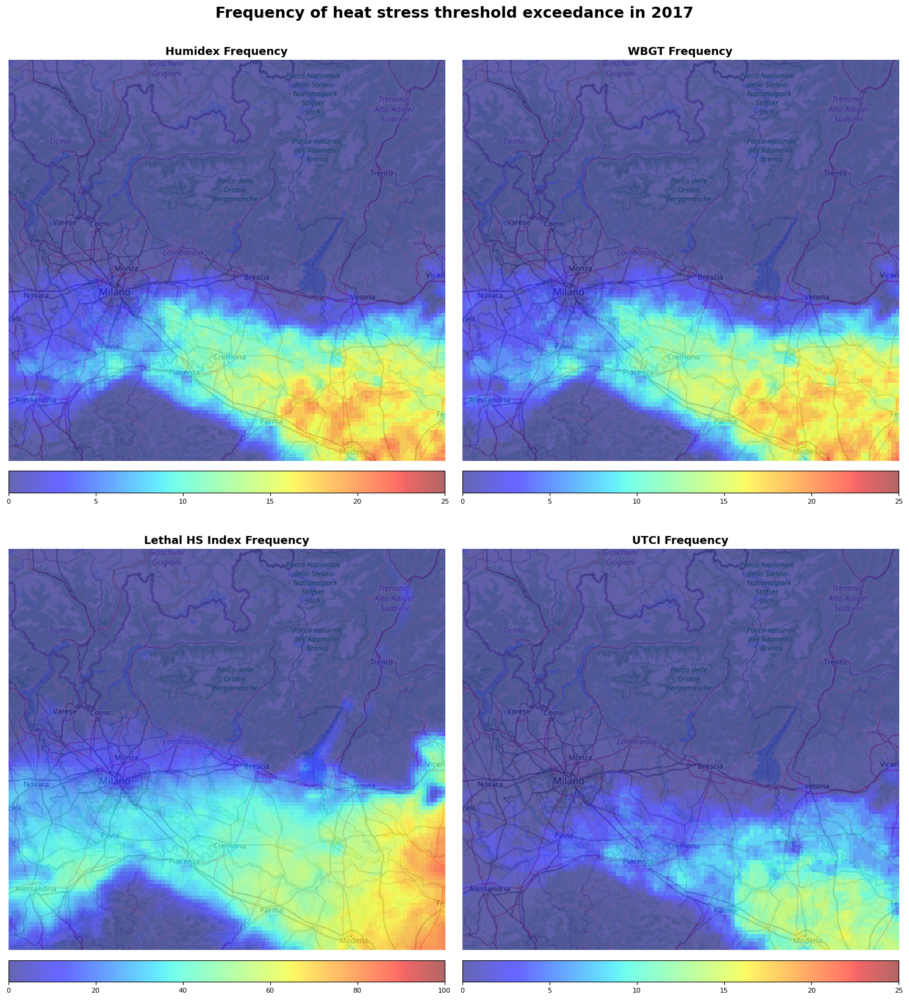

In [27]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter
import contextily as ctx
from pyproj import Transformer

# === PARAMETRI ===
selected_year = 2017
path_cube = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heatstress_indices_exceedance_cube\heatstress_indices_exceedance_cube.nc"

path_temp = "C:/Users/andre/OneDrive/Desktop/Datasets_Geoinfprj/Enlarged_datasets/2m_air_temp/air_temperature_era5-81_23.nc"

# === CARICA DATI ===
ds = xr.open_dataset(path_cube)
ds_temp = xr.open_dataset(path_temp)

# === DATI 2017 DAL CUBE ===
humidex_freq = ds["humidex_exceedance"].sel(year=selected_year)
wbgt_freq    = ds["wbgt_exceedance"].sel(year=selected_year)
lhs_freq     = ds["lhs_exceedance"].sel(year=selected_year)
utci_freq    = ds["utci_exceedance"].sel(year=selected_year)

# === SMOOTHING ===
humidex_smooth = uniform_filter(humidex_freq, size=3)
wbgt_smooth    = uniform_filter(wbgt_freq, size=3)
lhs_smooth     = uniform_filter(lhs_freq, size=3)
utci_smooth    = uniform_filter(utci_freq, size=3)

# === COORDINATE PER MESH (uguale a prima!)
lon = ds_temp["lon"]
lat = ds_temp["lat"]
lon1d = lon[0, :] if lon.ndim == 2 else lon
lat1d = lat[:, 0] if lat.ndim == 2 else lat
lon_mesh, lat_mesh = np.meshgrid(lon1d, lat1d)

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_mesh, y_mesh = transformer.transform(lon_mesh, lat_mesh)

# === PLOT ===
def plot_4maps_smoothed(datasets, titles, cmaps, alpha=0.6,
                        title_fontsize=18, map_title_fontsize=13, colorbar_fontsize=8):
    fig, axs = plt.subplots(2, 2, figsize=(15, 17))
    plt.suptitle(f"Frequency of heat stress threshold exceedance in {selected_year}",
                 fontsize=title_fontsize, fontweight="bold", y=1.0)
    axs = axs.flatten()

    for i, (data, title, cmap) in enumerate(zip(datasets, titles, cmaps)):
        ax = axs[i]
        ax.set_xlim(x_mesh.min(), x_mesh.max())
        ax.set_ylim(y_mesh.min(), y_mesh.max())

        # === Basemap PRIMA ===
        ctx.add_basemap(ax, crs="EPSG:3857", source=ctx.providers.OpenStreetMap.Mapnik, attribution=False)

        # === Color scale ===
        vmin, vmax = (0, 100) if "Lethal" in title else (0, 25)

        im = ax.imshow(data, extent=[x_mesh.min(), x_mesh.max(), y_mesh.min(), y_mesh.max()],
                       origin="lower", cmap=cmap, alpha=alpha, vmin=vmin, vmax=vmax)
        
        ax.set_title(title, fontsize=map_title_fontsize, fontweight='bold')
        ax.axis("off")

        cbar = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.02)
        cbar.ax.tick_params(labelsize=colorbar_fontsize)

    plt.tight_layout()
    return fig

# === ESECUZIONE ===
fig = plot_4maps_smoothed(
    datasets=[humidex_smooth, wbgt_smooth, lhs_smooth, utci_smooth],
    titles=["Humidex Frequency", "WBGT Frequency", "Lethal HS Index Frequency", "UTCI Frequency"],
    cmaps=["jet", "jet", "jet", "jet"],
    alpha=0.6
)
plt.show()


#### 05.5 - Heat stress indices exceedance for a user selected interval

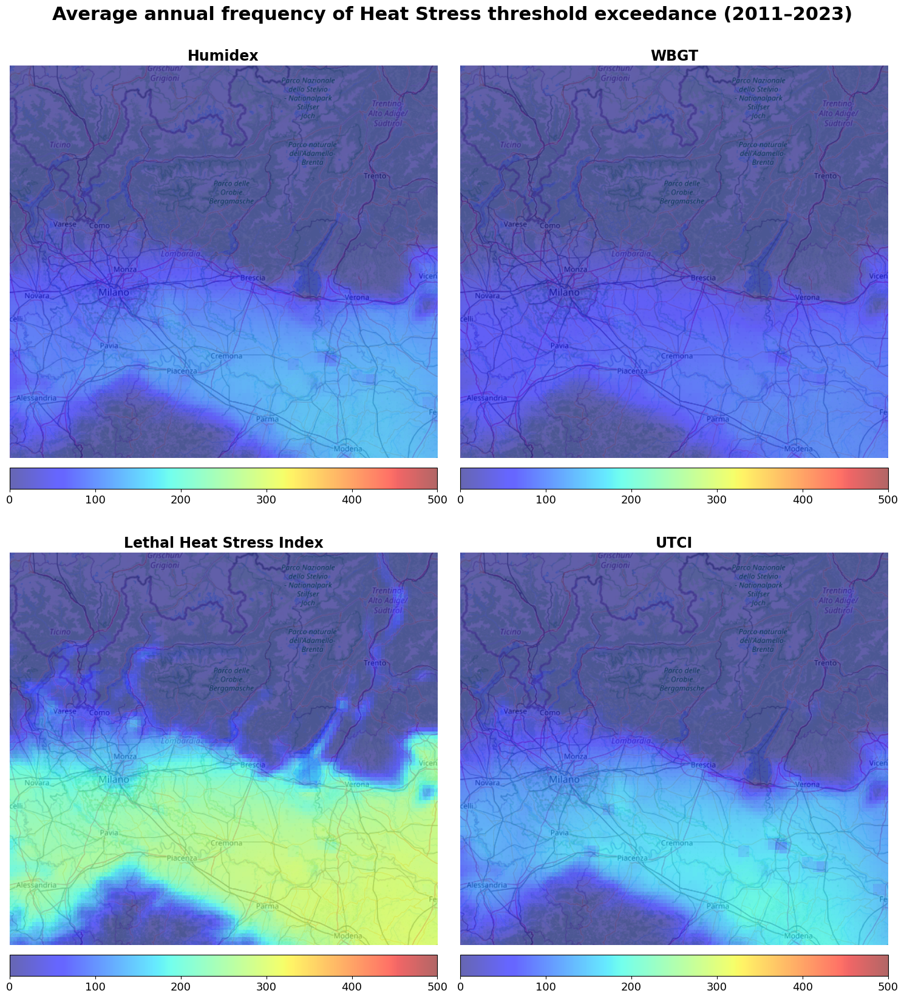

In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from pyproj import Transformer
from scipy.ndimage import uniform_filter
import os

# === PARAMETRI MODIFICABILI ===
start_year = 2011
end_year = 2023

dataset_path = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heatstress_indices_exceedance_cube\heatstress_indices_exceedance_reduced_thresholds_cube.nc"
temp_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Enlarged_datasets\2m_air_temp\air_temperature_era5-81_23.nc"

output_path = fr"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heat_stress_indices_excedance_frequency_exports\frequenza_heatstressindices_{start_year}_{end_year}.png"

title_fontsize = 22
map_title_fontsize = 17
colorbar_labelsize = 13
alpha = 0.6

vmax_dict = {
    "Humidex": 500,
    "WBGT": 500,
    "Lethal": 500,
    "UTCI": 500
}

# === CARICAMENTO DATASET ===
ds = xr.open_dataset(dataset_path)
ds_temp = xr.open_dataset(temp_path)

# === ESTRATTA MEDIA ANNUALE NELL’INTERVALLO
humidex_mean = ds["humidex_exceedance"].sel(year=slice(start_year, end_year)).mean(dim="year")
wbgt_mean    = ds["wbgt_exceedance"].sel(year=slice(start_year, end_year)).mean(dim="year")
lhs_mean     = ds["lhs_exceedance"].sel(year=slice(start_year, end_year)).mean(dim="year")
utci_mean    = ds["utci_exceedance"].sel(year=slice(start_year, end_year)).mean(dim="year")

# === SMOOTHING
humidex_mean = uniform_filter(humidex_mean, size=3)
wbgt_mean    = uniform_filter(wbgt_mean, size=3)
lhs_mean     = uniform_filter(lhs_mean, size=3)
utci_mean    = uniform_filter(utci_mean, size=3)

# === COORDINATE 2D
lon = ds_temp["lon"]
lat = ds_temp["lat"]
lon1d = lon[0, :] if lon.ndim == 2 else lon
lat1d = lat[:, 0] if lat.ndim == 2 else lat
lon_mesh, lat_mesh = np.meshgrid(lon1d, lat1d)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_mesh, y_mesh = transformer.transform(lon_mesh, lat_mesh)

# === FUNZIONE DI PLOT
def plot_average_exceedance_maps(datasets, titles, cmaps, alpha,
                                  title_fontsize, map_title_fontsize,
                                  colorbar_labelsize, vmax_dict, suptitle):
    fig, axs = plt.subplots(2, 2, figsize=(15, 17))
    plt.suptitle(suptitle, fontsize=title_fontsize, fontweight="bold", y=1.0)
    axs = axs.flatten()

    for i, (data, title, cmap) in enumerate(zip(datasets, titles, cmaps)):
        ax = axs[i]
        ax.set_xlim(x_mesh.min(), x_mesh.max())
        ax.set_ylim(y_mesh.min(), y_mesh.max())
        try:
            ctx.add_basemap(ax, crs="EPSG:3857", source=ctx.providers.OpenStreetMap.Mapnik, attribution=False)
        except Exception as e:
            print(f"⚠️ Errore nel caricamento della basemap: {e}")

        vmax = vmax_dict.get(title.split()[0], None)
        vmin = 0

        im = ax.imshow(data, extent=[x_mesh.min(), x_mesh.max(), y_mesh.min(), y_mesh.max()],
                       origin='lower', cmap=cmap, alpha=alpha, vmin=vmin, vmax=vmax)

        ax.set_title(title, fontsize=map_title_fontsize, fontweight='bold')
        ax.axis("off")

        cbar = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.02)
        cbar.ax.tick_params(labelsize=colorbar_labelsize)

    plt.tight_layout()
    return fig

# === PLOT E EXPORT
fig = plot_average_exceedance_maps(
    datasets=[humidex_mean, wbgt_mean, lhs_mean, utci_mean],
    titles=["Humidex", "WBGT", "Lethal Heat Stress Index", "UTCI"],
    cmaps=["jet"] * 4,
    alpha=alpha,
    title_fontsize=title_fontsize,
    map_title_fontsize=map_title_fontsize,
    colorbar_labelsize=colorbar_labelsize,
    vmax_dict=vmax_dict,
    suptitle=f"Average annual frequency of Heat Stress threshold exceedance ({start_year}–{end_year})"
)

fig.savefig(output_path, dpi=300, bbox_inches="tight")
plt.show()

#### 05.8 - Heat stress indices exceedance increase decade-long

The following code computes for each pixel (and each index) the regression line among how many times it overpassed the threshold. The slope of this regression line is computed and multiplied by 10 return us the increase of days per decade the threshold got overpassed

Calcolo slope: 100%|█████████████████████████████████████████████████████████████████| 103/103 [00:45<00:00,  2.25it/s]


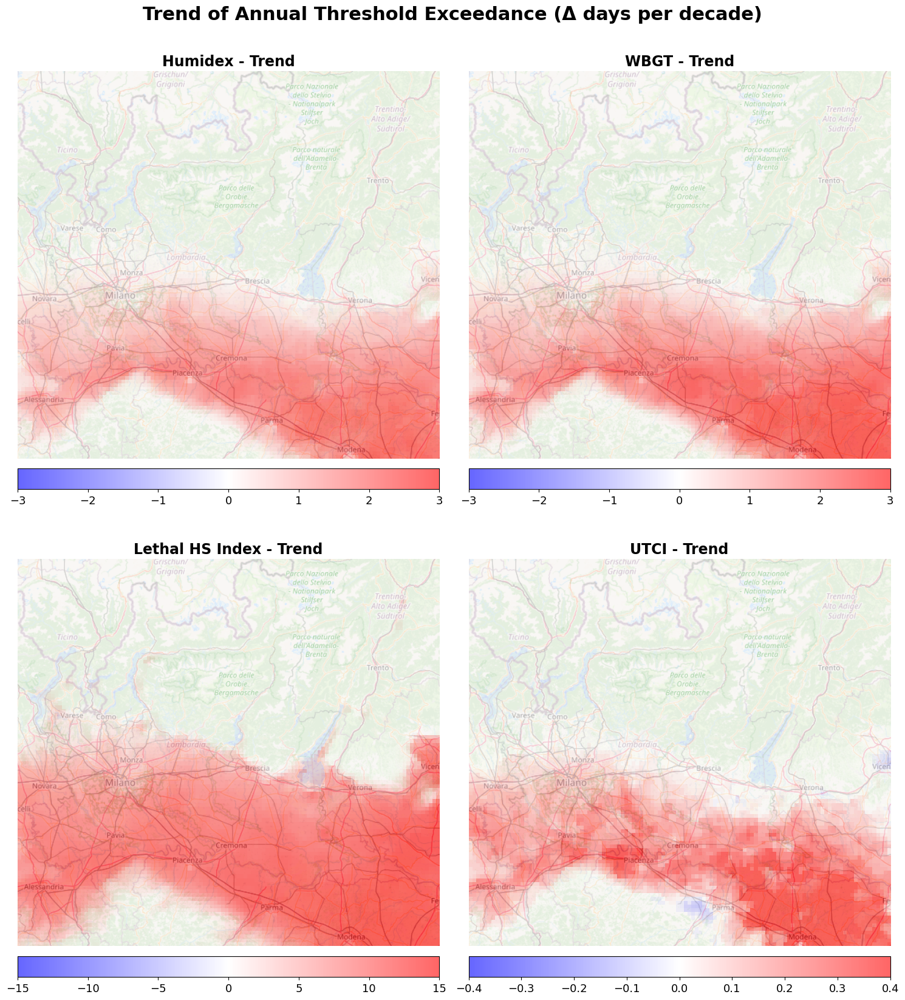

In [51]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from pyproj import Transformer
from scipy.stats import linregress
from tqdm import tqdm
from scipy.ndimage import median_filter

# === PARAMETRI ===
dataset_path = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\heatstress_indices_exceedance_cube\heatstress_indices_exceedance_cube.nc"
temp_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Enlarged_datasets\2m_air_temp\air_temperature_era5-81_23.nc"

# === CARICAMENTO DATASET ===
ds = xr.open_dataset(dataset_path)
ds_temp = xr.open_dataset(temp_path)

# === ANNI ===
years = ds["year"].values

# === FUNZIONE PER CALCOLARE LA SLOPE PER OGNI PIXEL ===
def compute_slope_map(da):
    rlat = da.sizes["rlat"]
    rlon = da.sizes["rlon"]
    slopes = np.full((rlat, rlon), np.nan)

    for i in tqdm(range(rlat), desc="Calcolo slope"):
        for j in range(rlon):
            y = da[:, i, j].values
            if not np.isnan(y).all():
                slope, _, _, _, _ = linregress(years, y)
                slopes[i, j] = slope * 10  # Giorni per decade
    return slopes

# === CALCOLO SLOPE PER OGNI INDICE ===
humidex_slope = compute_slope_map(ds["humidex_exceedance"])
wbgt_slope    = compute_slope_map(ds["wbgt_exceedance"])
lhs_slope     = compute_slope_map(ds["lhs_exceedance"])
utci_slope    = compute_slope_map(ds["utci_exceedance"])

# === SMOOTHING CON FILTER PER EVITARE BUCHI E MANTENERE PICCHI ===
humidex_slope = median_filter(humidex_slope, size=3)
wbgt_slope    = median_filter(wbgt_slope, size=3)
lhs_slope     = median_filter(lhs_slope, size=3)
utci_slope    = median_filter(utci_slope, size=3)

# === COORDINATE PER IL PLOT (da ds_temp)
lon = ds_temp["lon"]
lat = ds_temp["lat"]
lon1d = lon[0, :] if lon.ndim == 2 else lon
lat1d = lat[:, 0] if lat.ndim == 2 else lat
lon_mesh, lat_mesh = np.meshgrid(lon1d, lat1d)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_mesh, y_mesh = transformer.transform(lon_mesh, lat_mesh)

# === VALORI INDIVIDUALI DI SCALA PER LE LEGENDE ===
vminmax_dict = {
    "Humidex": (-3, 3),
    "WBGT": (-3, 3),
    "Lethal": (-15, 15),
    "UTCI": (-0.4, 0.4)
}

# === FUNZIONE DI PLOT ===
def plot_trend_maps(datasets, titles, 
                    cmaps, alpha=0.6,
                    title_fontsize=22, 
                    map_title_fontsize=17, 
                    colorbar_fontsize=13,
                    vminmax_dict=None):
    
    fig, axs = plt.subplots(2, 2, figsize=(15, 17))
    plt.suptitle("Trend of Annual Threshold Exceedance (Δ days per decade)",
                 fontsize=title_fontsize, fontweight="bold", y=1.0)
    axs = axs.flatten()

    for i, (data, title, cmap) in enumerate(zip(datasets, titles, cmaps)):
        ax = axs[i]
        ax.set_xlim(x_mesh.min(), x_mesh.max())
        ax.set_ylim(y_mesh.min(), y_mesh.max())

        ctx.add_basemap(ax, crs="EPSG:3857", source=ctx.providers.OpenStreetMap.Mapnik, attribution=False)

        # === SCALA INDIVIDUALE ===
        vmin, vmax = -1, 1  # fallback
        if vminmax_dict is not None:
            for key in vminmax_dict:
                if key in title:
                    vmin, vmax = vminmax_dict[key]
                    break
            else:
                vmax = np.nanmax(np.abs(data))
                vmin = -vmax

        im = ax.imshow(data, extent=[x_mesh.min(), x_mesh.max(), y_mesh.min(), y_mesh.max()],
                       origin='lower', cmap=cmap, alpha=alpha, vmin=vmin, vmax=vmax)

        ax.set_title(title, fontsize=map_title_fontsize, fontweight='bold')
        ax.axis("off")
        cbar = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.02)
        cbar.ax.tick_params(labelsize=colorbar_fontsize)

    plt.tight_layout()
    return fig

# === ESECUZIONE PLOT ===
fig = plot_trend_maps(
    datasets=[humidex_slope, wbgt_slope, lhs_slope, utci_slope],
    titles=["Humidex - Trend", "WBGT - Trend", "Lethal HS Index - Trend", "UTCI - Trend"],
    cmaps=["bwr", "bwr", "bwr", "bwr"],
    alpha=0.6,
    vminmax_dict=vminmax_dict
)

output_path = r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\exceedance_delta_days_decade.png"  # <-- cambia con la tua directory preferita
plt.savefig(output_path, dpi=300, bbox_inches="tight")

plt.show()